In [1]:
figurepath = '/home/spxtr/noblehierarch/figures'
datapath = '/home/spxtr/noblehierarch/data/'

In [2]:
import io
import os.path

import numpy as np
np.seterr(divide='ignore', invalid='ignore')

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import SymLogNorm, LinearSegmentedColormap
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['image.cmap'] = 'cividis'
plt.rcParams['axes.linewidth'] = 1
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['xtick.top'] = 'True'
plt.rcParams['xtick.major.size'] = 5
plt.rcParams['xtick.major.width'] = 1
plt.rcParams['xtick.minor.size'] = 2.5
plt.rcParams['xtick.minor.width'] = 1
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['ytick.right'] = 'True'
plt.rcParams['ytick.major.size'] = 5
plt.rcParams['ytick.major.width'] = 1
plt.rcParams['ytick.minor.size'] = 2.5
plt.rcParams['ytick.minor.width'] = 1
plt.rcParams['lines.linewidth'] = 1.5
plt.rcParams['font.size'] = 12
plt.rcParams['axes.labelsize']=12
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['pcolor.shading'] = 'gouraud'
plt.rcParams['figure.dpi'] = 200


import IPython.display
IPython.display.set_matplotlib_formats('svg')

# cupy will greatly speed up eigenvalue computations if run on a reasonably
# recent gpu. For the most part the usage is identical, but cupy arrays need
# a .get() to turn them into numpy arrays.
try:
    import cupy as cp
    cpget = lambda a: a.get()
except ImportError:
    cp = np
    cpget = lambda a: a

    
me = 9.10938356E-31
e = 1.602E-19
eps0 = 8.854E-12
h = 6.62607E-34
hbar = 1.054571800E-34
kb = 1.38064852E-23
epsBN = 3 * eps0
epsSiO2 = 4 * eps0

t = 20e-9 # Thickness of hBN in m
C = epsBN / t # Capacitnace in F/m^2

m = 1.5
b = -1.25
Vbg0 = b / (2*m)
Vtg0 = b / 2
def xformgates(Vtg, Vbg):
    Dtilde = m*(Vbg - Vbg0) - (Vtg - Vtg0)
    ntilde = m*(Vbg - Vbg0) + (Vtg - Vtg0)
    n = C * ntilde / (e*1E4) / 1E12
    D = C * 1E-9 * Dtilde / (2*eps0)
    return n, D

def reshape_and_pad(data, r, c):
    return np.pad(data, (0, r*c - len(data)), mode='constant').reshape(r, c)


SQUARES = 3
B0 = 45

<ipython-input-2-6ac9c4890947>:34: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats('svg')


In [3]:
cwdat = '''0	4587	15073
0	5778	16324
0	6970	17575
0	8161	18826
0	9353	20077
0	10544	21328
0	11736	22579
0	12927	23830
0	14119	25081
0	15310	26332
0	16502	27583
0	17694	28835
0	17694	28835
59	18945	30205
119	20196	31575
178	21447	32945
238	22698	34316
297	23949	35686
357	25200	37056
416	26451	38426
476	27702	39797
535	28953	41167
595	30204	42537
655	31456	43908
655	31456	43908
655	32520	45054
655	33585	46201
655	34650	47348
655	35715	48495
655	36780	49641
655	37845	50788
655	38910	51935
655	39975	53082
655	39976	53083
786	40762	54000
917	41548	54917
1048	42335	55835
1179	43121	56752
1310	43908	57670
1310	43908	57670
1310	44891	58653
1310	45874	59636
1310	45874	59636
1637	46529	60291
1965	47184	60946
1966	47185	60947
1966	47316	61340
1966	47447	61733
1966	47578	62126
1966	47709	62519
1966	47840	62913
1966	47840	62913
2293	48167	63240
2621	48495	63568
2621	48495	63568
2784	48331	63568
2948	48167	63568
3112	48003	63568
3276	47840	63568
3439	47676	63568
3603	47512	63568
3767	47348	63568
3931	47185	63568
3932	47185	63568
4194	46660	63306
4456	46136	63044
4718	45612	62782
4980	45088	62520
5242	44564	62258
5242	44563	62258
5373	43907	61602
5504	43252	60947
5635	42597	60292
5766	41942	59637
5897	41287	58982
5898	41287	58981
6291	40500	58194
6684	39714	57408
7077	38927	56621
7470	38141	55835
7864	37355	55049
7864	37354	55049
8126	36567	54000
8388	35781	52952
8650	34994	51903
8912	34208	50855
9174	33422	49807
9174	33422	49806
9531	32588	48614
9888	31754	47422
10246	30920	46231
10603	30086	45039
10961	29252	43848
11318	28418	42656
11676	27584	41465
12033	26750	40273
12391	25916	39082
12748	25082	37890
13106	24248	36699
13107	24247	36699
13516	23427	35634
13926	22608	34569
14335	21789	33504
14745	20970	32439
15154	20151	31374
15564	19332	30309
15973	18513	29244
16383	17694	28180
16383	17694	28180
17038	17039	26542
17693	16384	24904
17694	16383	24903
18349	15728	23920
19004	15073	22937
19005	15073	22937
19529	14548	22150
20053	14024	21364
20577	13500	20577
21101	12976	19791
21626	12452	19005
21626	12451	19005
22150	12057	18349
22674	11664	17694
23198	11271	17039
23722	10878	16384
24247	10485	15729
24247	10485	15728
24783	10306	15370
25319	10127	15013
25855	9948	14655
26391	9770	14298
26927	9591	13940
27464	9412	13583
28000	9233	13225
28536	9055	12868
29072	8876	12510
29608	8697	12153
30145	8519	11796
30146	8519	11796
30801	8399	11617
31456	8280	11438
32111	8161	11259
32767	8042	11081
33422	7923	10902
34077	7804	10723
34732	7685	10544
35388	7566	10366
36043	7447	10187
36698	7328	10008
37354	7209	9830
37354	7208	9830
38068	7088	9710
38783	6969	9591
39498	6850	9472
40213	6731	9353
40928	6612	9234
41643	6493	9115
42358	6374	8996
43073	6255	8877
43788	6136	8758
44503	6017	8639
45218	5898	8520
45219	5898	8519
45874	5957	8399
46529	6017	8280
47184	6076	8161
47840	6136	8042
48495	6195	7923
49150	6255	7804
49805	6314	7685
50461	6374	7566
51116	6433	7447
51771	6493	7328
52427	6553	7209
52428	6553	7208
53001	6716	7126
53574	6880	7044
54148	7044	6962
54721	7208	6880
55294	7371	6798
55868	7535	6716
56441	7699	6634
57015	7863	6553
57015	7864	6553
57539	8257	6553
58063	8650	6553
58587	9043	6553
59111	9436	6553
59636	9830	6553
59636	9830	6553
60029	10223	6553
60422	10616	6553
60815	11009	6553
61208	11402	6553
61602	11796	6553
61602	11796	6553
61864	12451	6553
62126	13106	6553
62388	13761	6553
62650	14416	6553
62912	15072	6553
62913	15073	6553
63032	15728	6553
63151	16383	6553
63270	17038	6553
63389	17694	6553
63508	18349	6553
63627	19004	6553
63746	19659	6553
63865	20315	6553
63984	20970	6553
64103	21625	6553
64223	22281	6553
64224	22281	6553
64283	22936	6612
64343	23591	6672
64402	24246	6731
64462	24902	6791
64521	25557	6850
64581	26212	6910
64640	26867	6969
64700	27523	7029
64759	28178	7088
64819	28833	7148
64879	29489	7208
64879	29490	7208
64938	30085	7208
64998	30681	7208
65057	31277	7208
65117	31872	7208
65176	32468	7208
65236	33064	7208
65295	33660	7208
65355	34255	7208
65414	34851	7208
65474	35447	7208
65534	36043	7208
65535	36044	7208
65535	36639	7148
65535	37235	7088
65535	37831	7029
65535	38426	6969
65535	39022	6910
65535	39618	6850
65535	40214	6791
65535	40809	6731
65535	41405	6672
65535	42001	6612
65535	42597	6553
65535	42597	6553
65535	43205	6506
65535	43814	6459
65535	44422	6412
65535	45031	6365
65535	45639	6319
65535	46248	6272
65535	46856	6225
65535	47465	6178
65535	48073	6131
65535	48682	6085
65535	49290	6038
65535	49899	5991
65535	50507	5944
65535	51116	5898
65535	51117	5898
65535	51903	5898
65535	52689	5898
65535	53476	5898
65535	54262	5898
65535	55049	5898
65535	55049	5898
65535	55704	5767
65535	56359	5636
65535	57014	5505
65535	57669	5374
65535	58325	5243
65535	58326	5242
65535	58981	5111
65535	59636	4980
65535	60291	4849
65535	60946	4718
65535	61602	4587
65535	61602	4587
65535	61995	4456
65535	62388	4325
65535	62781	4194
65535	63174	4063
65535	63568	3932
65535	63568	3932
65535	64223	3604
65535	64878	3277
65535	64879	3276
65535	64960	3194
65535	65042	3112
65535	65124	3030
65535	65206	2948
65535	65288	2866
65535	65370	2784
65535	65452	2702
65535	65534	2621'''

def coldHot(trunclo, trunchi):
    mat = np.loadtxt(io.StringIO(cwdat))
    n = np.shape(mat[int(trunclo):-int(trunchi)])[0]
    rdat = mat[int(trunclo):-int(trunchi),0] / np.max(mat[int(trunclo):-int(trunchi),0])
    gdat = mat[int(trunclo):-int(trunchi),1] / np.max(mat[int(trunclo):-int(trunchi),1])
    bdat = mat[int(trunclo):-int(trunchi),2] / np.max(mat[int(trunclo):-int(trunchi),2])
    r = np.zeros((n, 3))
    g = np.zeros((n, 3))
    b = np.zeros((n, 3))
    r[:,1] = rdat
    r[:,2] = rdat
    g[:,1] = gdat
    g[:,2] = gdat
    b[:,1] = bdat
    b[:,2] = bdat
    x = np.linspace(0, 1, n)
    r[:,0] = x
    g[:,0] = x
    b[:,0] = x
    r = tuple(map(tuple, r))
    g = tuple(map(tuple, g))
    b = tuple(map(tuple, b))
    cdict = {'red':r, 'green':g, 'blue':b}
    myColdhot = LinearSegmentedColormap('coldhot', cdict)
    return myColdhot
coldhot = coldHot(60, 10)

In [4]:
def Hamiltonian(p, q, a_1, a_2):
    '''Computes the Hamiltonian for the given field p/q.'''
    H = cp.zeros((q, q), dtype=np.complex128)
    for i in range(q):
        H[i, i] += 2 * cp.cos(2 * cp.pi * i * p / q)
        H[(i + 1) % q, i] += a_1
        H[(i - 1) % q, i] += a_1.conjugate()
        H[(i + 2) % q, i] += a_2
        H[(i - 2) % q, i] += a_2.conjugate()
    return H

def calc_spectrum(ps, q, a_1, a_2):
    '''Calculates the spectrum for the given fields [p / q for p in ps].'''
    spectrum = cp.zeros((len(ps), q))
    for i, p in enumerate(ps):
        spectrum[i, :] = cp.linalg.eigvalsh(Hamiltonian(p, q, a_1, a_2))
    return spectrum

def makebins(spectrum, a, xbins=1000):
    '''Calculates histogram bins for the given spectrum and field values.
    
    The idea is that we want evenly-spaced bins in field that each contain one
    set of eigenvalues, which will reduce aliasing artifacts when plotted.
    There will still be some artifacts in x.
    '''
    return [np.linspace(np.min(spectrum), np.max(spectrum), xbins),
            np.linspace(np.min(a - (a[1] - a[0]) / 2), np.max(a) + (a[1] - a[0]) / 2, len(a) + 1)]

In [5]:
xs = np.linspace(-4, 4, 1039)
ys = np.linspace(14, 0, 701)
curr = -np.loadtxt(os.path.join(datapath, 'superfan/sr830_3_X.dat.gz'))[:,-1].reshape(len(ys), len(xs))
zs = np.ma.masked_array(np.loadtxt(os.path.join(datapath, 'superfan/sr830_1_X.dat.gz'))[:,-1].reshape(len(ys), len(xs)), curr < 1e-10) / curr / SQUARES

# Fig. 1

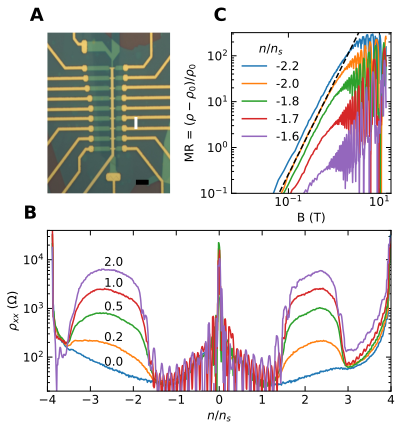

In [30]:
fig = plt.figure(figsize=(5.5, 5.5), constrained_layout=True)
gs = fig.add_gridspec(2, 2, width_ratios=[1, 1.3], height_ratios=[1, 1])

ax0 = fig.add_subplot(gs[0, 0])
img = mpl.image.imread(os.path.join(datapath, 'deviceimage.jpg'))
ax0.imshow(img[200:-100,450:-350], aspect='auto')
ax0.set_axis_off()
ax0.plot([900, 900 + 3 * 5 / 0.116], [1150, 1150], 'k', lw=5, solid_capstyle='butt')
ax0.plot([900, 900], [660, 730], 'w', lw=3)

ax1 = fig.add_subplot(gs[0, 1])
for c, i in enumerate([240, 265, 280, 295, 310]):
    ax1.loglog(ys, 0.7**c * (zs[:, i] - zs[-1, i]) / zs[-1, i], label=f'{xs[i]:.1f}')
ax1.set_ylabel('MR = $(\\rho - \\rho_0) / \\rho_0$')
ax1.set_xlabel('B (T)')
ax1.set_xlim(18 * (0.1 / 320), 18)
ax1.set_ylim(0.1, 320)
ax1.legend(title='$n/n_s$', frameon=False)
ax1.plot(np.linspace(0, 14, 1001), 26 * np.linspace(0, 14, 1001)**2, 'k--')

ax2 = fig.add_subplot(gs[1, :])
for c, i in enumerate([-1, -11, -26, -51, -101]):
    ax2.semilogy(xs, np.ma.masked_array(zs[i,:], zs[i,:] < 1), label=f'{xs[i]:.0f}')
    ax2.text(xs[200], zs[i, 200]*1.1, f'{ys[i]:.1f}', va='bottom', ha='center')
ax2.set_ylabel('$ρ_{xx}$ (Ω)')
ax2.set_xlabel('$n/n_s$')
ax2.set_ylim(20, 4e4)
ax2.set_xlim(-4, 4)

t1 = fig.text(-0.03, 1.05, 'A', ha='right', va='bottom', transform=ax0.transAxes, fontweight='bold', fontsize=18)
t2 = fig.text(-0.03, 1.05, 'B', ha='right', va='bottom', transform=ax2.transAxes, fontweight='bold', fontsize=18)
t3 = fig.text(-0.03, 1.05, 'C', ha='right', va='bottom', transform=ax1.transAxes, fontweight='bold', fontsize=18)
plt.savefig(os.path.join(figurepath, 'fig1.pdf'), bbox_extra_artists=(t1, t2, t3), bbox_inches='tight')
plt.show()

# Fig. 2

In [31]:
fig = plt.figure(figsize=(11, 6), constrained_layout=True)
fig.set_constrained_layout_pads(w_pad=4./72., h_pad=1./72., hspace=0., wspace=0.)
gss = fig.add_gridspec(3, 3, height_ratios=[0.1, 3, 1])

ax0 = fig.add_subplot(gss[1, :])
ax1 = fig.add_subplot(gss[2, :], sharex=ax0)
cax = fig.add_subplot(gss[0, -1])

c = ax0.pcolormesh(xs, ys, zs, cmap=coldhot, norm=SymLogNorm(linthresh=0.1, base=10, vmin=1, vmax=2e5), linewidth=0, rasterized=True)
c.set_edgecolor('face')
ax0.set_ylim(0, 14)
ax0.set_facecolor('grey')
ax0.set_ylabel('$B$ (T)')
ax0.tick_params(axis='both', which='both', direction='in', bottom=True, top=True, left=True, right=True)
plt.setp(ax0.get_xticklabels(), visible=False)

ax1.set_xlabel('$n/n_s$')
ax1.set_xlim(-4, 4)
ax1.tick_params(axis='both', which='both', direction='in', bottom=True, top=True, left=True, right=True)

bax = ax0.twinx()
bax.set_ylim(0, 14 / B0)
bax.set_ylabel('$\\phi / \\phi_0$')


def makaline(ax, s, t, lo=0, hi=1, lw=1, ls='-'):
    ax.plot([s + t*lo, s + t*hi], [lo, hi], ls=ls, lw=lw, color='k')

makaline(ax1, 0, 1, 0.05, ls=':')
makaline(ax1, 0, 2, 0.02, ls=':')
makaline(ax1, 0, 3, 0.01, ls=':')
makaline(ax1, 0, 4)
makaline(ax1, 0, -1, 0.05, ls=':')
makaline(ax1, 0, -2, 0.02, ls=':')
makaline(ax1, 0, -3, 0.01, ls=':')
makaline(ax1, 0, -4)
makaline(ax1, 0, 6, 0.05, 0.15, ls=':')
makaline(ax1, 0, 8, 0, 0.225)
makaline(ax1, 0, 10, 0.05, 0.11, ls=':')
makaline(ax1, 0, 12, 0, 0.15)
makaline(ax1, 0, 16, 0, 0.11)
makaline(ax1, 0, 20, 0, 0.087)
makaline(ax1, 0, 24, 0, 0.07)
makaline(ax1, 0, -5, 0.07, 0.11, ls=':')
makaline(ax1, 0, -6, 0.05, 0.15, ls=':')
makaline(ax1, 0, -7, 0.06, 0.1, ls=':')
makaline(ax1, 0, -8, 0, 0.27)
makaline(ax1, 0, -10, 0.05, 0.11, ls=':')
makaline(ax1, 0, -12, 0, 0.15)
makaline(ax1, 0, -16, 0, 0.11)
makaline(ax1, 0, -20, 0, 0.087)
makaline(ax1, 0, -24, 0, 0.07)
makaline(ax1, 4, -4)
makaline(ax1, 4, -6, 0.05, 0.16, ls=':')
makaline(ax1, 4, -8, 0, 0.225)
makaline(ax1, 4, -12, 0, 0.13)
makaline(ax1, 4, -16, 0, 0.09)
makaline(ax1, 4, -20, 0, 0.07)
makaline(ax1, -4, 4, 0.03, 0.12)
makaline(ax1, -4, 6, 0.04, 0.08, ls=':')
makaline(ax1, -4, 2, ls=':')

makaline(ax1, 2, -6, 0.26, ls='--')
makaline(ax1, -2, 6, 0.26, ls='--')
makaline(ax1, -2, 8, 0.26, ls='--')
makaline(ax1, -2, 2, 0.27, ls='--')
makaline(ax1, 2, 2, 0.28, ls='--')
makaline(ax1, -2, -2, 0.28, ls='--')
makaline(ax1, 2, 4, 0.215, 0.25, ls='--')

ax1.set_ylim(0, 14.0/B0)
ax1.set_ylabel('$\\phi/\\phi_0$')
ax1.axvspan(-3.4, -1.6, color='red', alpha=0.3)
ax1.axvspan(1.5, 2.85, color='red', alpha=0.3)
ax1.axvspan(-4, -3.9, color='grey', alpha=1, zorder=100)

ax1.text(-3.58, 0.09, '+4', fontsize='x-small')

ax1.text(1.15, 0.27, '+4', fontsize='x-small')
ax1.text(1.65, 0.185, '+8', fontsize='x-small')
ax1.text(1.7, 0.12, '+12', fontsize='x-small')

ax1.text(-1.3, 0.27, '-4', fontsize='x-small')
ax1.text(-2.05, 0.22, '-8', fontsize='x-small')
ax1.text(-1.9, 0.12, '-12', fontsize='x-small')

ax1.text(2.7, 0.27, '-4', fontsize='x-small')
ax1.text(2.3, 0.17, '-8', fontsize='x-small')
ax1.text(2.35, 0.10, '-12', fontsize='x-small')

w0 = (-2.5, -1.5), (0.21, 0.29)
w1 = (-2.7, -2.1), (0.175, 0.225)

for w in [w0, w1]:
    ax1.plot([w[0][0], w[0][1], w[0][1], w[0][0], w[0][0]], [w[1][0], w[1][0], w[1][1], w[1][1], w[1][0]], '--', color='grey', lw=0.8, alpha=0.7)

plt.colorbar(c, cax=cax, orientation='horizontal', ticks=[1e1, 1e2, 1e3, 1e4, 1e5]).ax.set_ylabel('$ρ_{xx}$ (Ω)', rotation=0, ha='right', va='center')
cax.xaxis.set_ticks_position('top')

fig.text(-0.03, 1.05, 'A', ha='right', va='bottom', transform=ax0.transAxes, fontweight='bold', fontsize=18)
fig.text(-0.03, 0.95, 'B', ha='right', va='bottom', transform=ax1.transAxes, fontweight='bold', fontsize=18)
plt.savefig(os.path.join(figurepath, 'fig2.pdf'))

plt.show()

# Fig. 3

In [68]:
q = 5011
a1_0, a2_0 = 0.4, 2.5j
ps = np.arange(np.floor(q * 0.19) + 1, np.ceil(q * 0.21))
if False:
    eigs0 = cpget(cp.sort(calc_spectrum(ps, q, a1_0, a2_0)))
    np.savetxt(os.path.join(datapath, 'spectra/eigs0.txt.gz'), eigs0)
else:
    eigs0 = np.loadtxt(os.path.join(datapath, 'spectra/eigs0.txt.gz'))
g0 = np.gradient(eigs0)[1]
a0 = ps / q
n0 = np.linspace(0, 1, q)

In [69]:
q = 5011
a1_1, a2_1 = 0.3, 2.25j
ps = np.arange(np.floor(q * 0.19) + 1, np.ceil(q * 0.21))
if False:
    eigs1 = cpget(cp.sort(calc_spectrum(ps, q, a1_1, a2_1)))
    np.savetxt(os.path.join(datapath, 'spectra/eigs1.txt.gz', eigs1))
else:
    eigs1 = np.loadtxt(os.path.join(datapath, 'spectra/eigs1.txt.gz'))
g1 = np.gradient(eigs1)[1]
a1 = ps / q
n1 = np.linspace(0, 1, q)

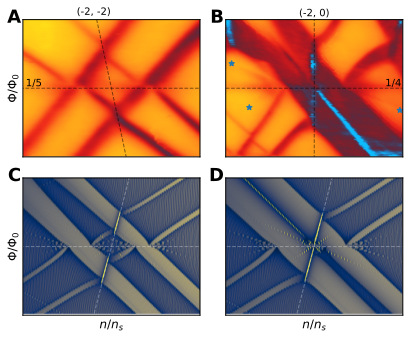

In [70]:
fig = plt.figure(figsize=(5.5, 4.5), constrained_layout=True)
fig.set_constrained_layout_pads(w_pad=0, h_pad=0, hspace=0.13, wspace=0.13)

gss = fig.add_gridspec(2, 2)

def makaline(ax, s, t, lo=0, hi=1, lw=1, ls='-'):
    ax.plot([s + t*lo, s + t*hi], [lo, hi], ls=ls, lw=lw, color='k', alpha=0.5)

ax0 = fig.add_subplot(gss[0, 0])
c0 = ax0.pcolormesh(xs, ys / B0, zs, cmap=coldhot, norm=SymLogNorm(linthresh=0.1, base=10, vmin=2e2, vmax=3e4), linewidth=0, rasterized=True)
ax0.set_xlim(-2.7, -2.1)
ax0.set_ylim(0.175, 0.225)
ax0.tick_params(bottom=False, top=False, left=False, right=False)
plt.setp(ax0.get_xticklabels(), visible=False)
plt.setp(ax0.get_yticklabels(), visible=False)
makaline(ax0, -2, -2, ls='--')
ax0.plot([-4, 4], [1/5, 1/5], 'k--', lw=1, alpha=0.5)
ax0.text(-2.69, 0.2, '1/5', fontsize='small', va='bottom')
ax0.text(-2.46, 0.226, '(-2, -2)', fontsize='small', va='bottom', ha='center')
ax0.set_ylabel('$\\Phi/\\Phi_0$')


ax2 = fig.add_subplot(gss[0, 1])
c2 = ax2.pcolormesh(xs, ys / B0, zs, cmap=coldhot, norm=SymLogNorm(linthresh=0.1, base=10, vmin=40, vmax=5e4), linewidth=0, rasterized=True)
ax2.set_xlim(-2.6, -1.4)
ax2.set_ylim(0.20, 0.30)
ax2.tick_params(bottom=False, top=False, left=False, right=False)
plt.setp(ax2.get_xticklabels(), visible=False)
plt.setp(ax2.get_yticklabels(), visible=False)
makaline(ax2, -2, 0, ls='--')
ax2.text(-1.41, 0.25, '1/4', fontsize='small', va='bottom', ha='right')
ax2.text(-2, 0.301, '(-2, 0)', fontsize='small', va='bottom', ha='center')
ax2.plot([-4, 4], [1/4, 1/4], 'k--', lw=1, alpha=0.5)
ax2.plot([-2.44, -2.56, -1.42], [0.236, 0.268, 0.234], '*')

ax3 = fig.add_subplot(gss[1, 0])
c3 = ax3.pcolormesh(n0, a0, g0, vmax=0.005, linewidth=0, rasterized=True)
ax3.set_xlim(0.15, 0.25)
ax3.set_ylim(0.19, 0.21)

def makaline(ax, s, t, lo=0, hi=1, lw=1, ls='-'):
    ax.plot([s + t*lo, s + t*hi], [lo, hi], ls=ls, lw=lw, color='w', alpha=0.3)

ax3.tick_params(bottom=False, top=False, left=False, right=False)
plt.setp(ax3.get_xticklabels(), visible=False)
plt.setp(ax3.get_yticklabels(), visible=False)
ax3.plot([0, 1], [1/5, 1/5], 'w--', lw=1, alpha=0.3)
makaline(ax3, 0, 1, ls='--')
ax3.set_ylabel('$\\Phi/\\Phi_0$')
ax3.set_xlabel('$n/n_s$')

ax5 = fig.add_subplot(gss[1, 1])
c5 = ax5.pcolormesh(n1, a1, g1, vmax=0.005, linewidth=0, rasterized=True)
ax5.set_xlim(0.15, 0.25)
ax5.set_ylim(0.19, 0.21)
ax5.tick_params(bottom=False, top=False, left=False, right=False)
plt.setp(ax5.get_xticklabels(), visible=False)
plt.setp(ax5.get_yticklabels(), visible=False)
ax5.plot([0, 1], [1/5, 1/5], 'w--', lw=1, alpha=0.3)
makaline(ax5, 0, 1, ls='--')
ax5.set_xlabel('$n/n_s$')

t1 = fig.text(-0.01, 0.95, 'A', ha='right', va='bottom', transform=ax0.transAxes, fontweight='bold', fontsize=18)
t2 = fig.text(-0.01, 0.95, 'B', ha='right', va='bottom', transform=ax2.transAxes, fontweight='bold', fontsize=18)
t3 = fig.text(-0.01, 0.95, 'C', ha='right', va='bottom', transform=ax3.transAxes, fontweight='bold', fontsize=18)
t4 = fig.text(-0.01, 0.95, 'D', ha='right', va='bottom', transform=ax5.transAxes, fontweight='bold', fontsize=18)
plt.savefig(os.path.join(figurepath, 'fig3.pdf'), bbox_extra_artists=(t1, t2, t3, t4), bbox_inches='tight')

plt.show()

# Fig. 4

In [138]:
q = 3001
ps = np.arange(0, q // 4 + 1)
ns = np.linspace(0, 1, q)
a = ps / q

a1_2, a2_2 = 0.0, 1.0j
a1_3, a2_3 = 0.0, 2.0j
a1_4, a2_4 = 0.15, 2.0j
a1_5, a2_5 = 0.3, 2.0j

if False:
    eigs2 = cpget(cp.sort(calc_spectrum(ps, q, a1_2, a2_2)))
    np.savetxt(os.path.join(datapath, 'spectra/eigs2.txt.gz'), eigs2)
else:
    eigs2 = np.loadtxt(os.path.join(datapath, 'spectra/eigs2.txt.gz'))

if False:
    eigs3 = cpget(cp.sort(calc_spectrum(ps, q, a1_3, a2_3)))
    np.savetxt(os.path.join(datapath, 'spectra/eigs3.txt.gz'), eigs3)
else:
    eigs3 = np.loadtxt(os.path.join(datapath, 'spectra/eigs3.txt.gz'))

if False:
    eigs4 = cpget(cp.sort(calc_spectrum(ps, q, a1_4, a2_4)))
    np.savetxt(os.path.join(datapath, 'spectra/eigs4.txt.gz'), eigs4)
else:
    eigs4 = np.loadtxt(os.path.join(datapath, 'spectra/eigs4.txt.gz'))

if False:
    eigs5 = cpget(cp.sort(calc_spectrum(ps, q, a1_5, a2_5)))
    np.savetxt(os.path.join(datapath, 'spectra/eigs5.txt.gz'), eigs5)
else:
    eigs5 = np.loadtxt(os.path.join(datapath, 'spectra/eigs5.txt.gz'))

g2 = np.gradient(eigs2)[1]
g3 = np.gradient(eigs3)[1]
g4 = np.gradient(eigs4)[1]
g5 = np.gradient(eigs5)[1]

In [139]:
fig = plt.figure(figsize=(11, 6), constrained_layout=True)
gss = fig.add_gridspec(2, 5, width_ratios=[1, 1, 1, 1, 0.05])

ax0 = fig.add_subplot(gss[0, 0])
ax0.set_title('$a_1 = 0$, $a_2 = i$')
H, xedges, yedges = np.histogram2d(eigs2.flatten(), np.repeat(a, q), bins=makebins(eigs2, a))
plt.imshow(H.T, cmap='Greys', vmax=15, extent=[xedges[0], xedges[-1], yedges[-1], yedges[0]], interpolation='antialiased', aspect='auto')
ax0.tick_params(bottom=False, top=False)
plt.setp(ax0.get_xticklabels(), visible=False)
ax0.set_ylim(0, 0.25)
ax0.set_xlim(np.min(eigs2), 0)
ax0.set_ylabel('$\\Phi/\\Phi_0$')
ax0.set_xlabel('Energy (arb. units)')


ax1 = fig.add_subplot(gss[1, 0])
c1 = ax1.pcolormesh(ns, a, g2, vmax=0.005, linewidth=0, rasterized=True)
ax1.set_ylim(0, 0.25)
ax1.set_xlim(0, 0.5)
ax1.set_ylabel('$\\Phi/\\Phi_0$')
ax1.set_xlabel('$n/n_s$')

ax2 = fig.add_subplot(gss[0, 1])
ax2.set_title('$a_1 = 0$, $a_2 = 2i$')
H, xedges, yedges = np.histogram2d(eigs3.flatten(), np.repeat(a, q), bins=makebins(eigs3, a))
plt.imshow(H.T, cmap='Greys', vmax=15, extent=[xedges[0], xedges[-1], yedges[-1], yedges[0]], interpolation='antialiased', aspect='auto')
ax2.tick_params(bottom=False, top=False)
plt.setp(ax2.get_xticklabels(), visible=False)
plt.setp(ax2.get_yticklabels(), visible=False)
ax2.set_ylim(0, 0.25)
ax2.set_xlim(np.min(eigs3), 0)
ax2.set_xlabel('Energy (arb. units)')


ax3 = fig.add_subplot(gss[1, 1])
c3 = ax3.pcolormesh(ns, a, g3, vmax=0.008, linewidth=0, rasterized=True)
ax3.set_ylim(0, 0.25)
ax3.set_xlim(0, 0.5)
plt.setp(ax3.get_yticklabels(), visible=False)
ax3.set_xlabel('$n/n_s$')

ax4 = fig.add_subplot(gss[0, 2])
ax4.set_title('$a_1 = 0.15$, $a_2 = 2i$')
H, xedges, yedges = np.histogram2d(eigs4.flatten(), np.repeat(a, q), bins=makebins(eigs4, a))
plt.imshow(H.T, cmap='Greys', vmax=15, extent=[xedges[0], xedges[-1], yedges[-1], yedges[0]], interpolation='antialiased', aspect='auto')
ax4.tick_params(bottom=False, top=False)
plt.setp(ax4.get_xticklabels(), visible=False)
plt.setp(ax4.get_yticklabels(), visible=False)
ax4.set_ylim(0, 0.25)
ax4.set_xlim(np.min(eigs4), 0)
ax4.set_xlabel('Energy (arb. units)')



ax5 = fig.add_subplot(gss[1, 2])
c5 = ax5.pcolormesh(ns, a, g4, vmax=0.008, linewidth=0, rasterized=True)
ax5.set_ylim(0, 0.25)
ax5.set_xlim(0, 0.5)
plt.setp(ax5.get_yticklabels(), visible=False)
ax5.set_xlabel('$n/n_s$')


ax6 = fig.add_subplot(gss[0, 3])
ax6.set_title('$a_1 = 0.3$, $a_2 = 2i$')
H, xedges, yedges = np.histogram2d(eigs5.flatten(), np.repeat(a, q), bins=makebins(eigs5, a))
plt.imshow(H.T, cmap='Greys', vmax=15, extent=[xedges[0], xedges[-1], yedges[-1], yedges[0]], interpolation='antialiased', aspect='auto')
ax6.tick_params(bottom=False, top=False)
plt.setp(ax6.get_xticklabels(), visible=False)
plt.setp(ax6.get_yticklabels(), visible=False)
ax6.set_ylim(0, 0.25)
ax6.set_xlim(np.min(eigs5), 0)
ax6.set_xlabel('Energy (arb. units)')
ax6.plot([-3.9, -3.95, -1.6], [0.25, 0.148, 0.25], '--', color='#ff3300')

ax7 = fig.add_subplot(gss[1, 3])
c7 = ax7.pcolormesh(ns, a, g5, vmax=0.008, linewidth=0, rasterized=True)
ax7.set_ylim(0, 0.25)
ax7.set_xlim(0, 0.5)
plt.setp(ax7.get_yticklabels(), visible=False)
ax7.set_xlabel('$n/n_s$')
ax7.plot([0.11, 0.115, 0.13, 0.15, 0.18, 0.25, 0.445], [0.25, 0.18, 0.15, 0.145, 0.148, 0.17, 0.25], '--', color='#ff3300')

w0 = (0.15, 0.25), (0.19, 0.21)

for w in [w0]:
    ax7.plot([w[0][0], w[0][1], w[0][1], w[0][0], w[0][0]], [w[1][0], w[1][0], w[1][1], w[1][1], w[1][0]], ':', color='w', lw=1, alpha=0.7)
cax = fig.add_subplot(gss[1, -1])
plt.colorbar(c7, cax=cax, orientation='vertical', ticks=[]).ax.set_ylabel('$d\\mu /dn$ (arb. units)')

t1 = fig.text(-0.01, 1.02, 'A', ha='right', va='bottom', transform=ax0.transAxes, fontweight='bold', fontsize=18)
t2 = fig.text(-0.01, 1.02, 'E', ha='right', va='bottom', transform=ax1.transAxes, fontweight='bold', fontsize=18)
t3 = fig.text(-0.01, 1.02, 'B', ha='right', va='bottom', transform=ax2.transAxes, fontweight='bold', fontsize=18)
t4 = fig.text(-0.01, 1.02, 'F', ha='right', va='bottom', transform=ax3.transAxes, fontweight='bold', fontsize=18)
t5 = fig.text(-0.01, 1.02, 'D', ha='right', va='bottom', transform=ax6.transAxes, fontweight='bold', fontsize=18)
t6 = fig.text(-0.01, 1.02, 'H', ha='right', va='bottom', transform=ax7.transAxes, fontweight='bold', fontsize=18)
t7 = fig.text(-0.01, 1.02, 'C', ha='right', va='bottom', transform=ax4.transAxes, fontweight='bold', fontsize=18)
t8 = fig.text(-0.01, 1.02, 'G', ha='right', va='bottom', transform=ax5.transAxes, fontweight='bold', fontsize=18)
plt.savefig(os.path.join(figurepath, 'fig4.pdf'), bbox_extra_artists=(t1, t2, t3, t4, t5, t6, t7, t8), bbox_inches='tight')

plt.show()

# Fig. S1

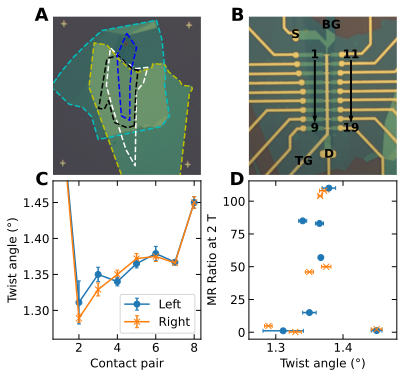

In [6]:
f = plt.figure(figsize=(5.5, 5), constrained_layout=True)
gs = f.add_gridspec(2, 2)

# A

ax1 = f.add_subplot(gs[0, 0])

img = mpl.image.imread(os.path.join(datapath, 'stackimage.jpg'))[210:-350,550:-480]
ax1.imshow(img, aspect='auto')
ax1.set_axis_off()

ax1.plot(
    [470, 247, 283, 371, 460, 541, 587, 680, 689, 735, 764, 796, 874, 888, 953, 958, 938, 875],
    [974, 433, 162, 174, 270, 330, 342, 314, 288, 293, 287, 340, 398, 423, 429, 447, 473, 975], 'y--')
ax1.plot(
    [  3,  55, 138, 224, 336, 712, 750, 774, 767, 801, 746, 311, 265, 203, 110,   3],
    [409, 341, 252, 175,  85,  22, 141, 380, 422, 612, 677, 757, 616, 559, 539, 446], 'c--')
ax1.plot(
    [398, 480, 571, 652, 622, 574, 565, 502, 403, 367, 392, 398],
    [194, 270, 320, 312, 408, 460, 919, 820, 542, 424, 212, 194], 'w--')
ax1.plot(
    [559, 510, 422, 382, 353, 314, 371, 450, 552, 585, 570, 559],
    [672, 685, 652, 517, 570, 565, 257, 240, 326, 328, 449, 672], 'k--')
ax1.plot(
    [507, 575, 541, 529, 528, 470, 445, 442, 507],
    [102, 191, 316, 427, 639, 611, 316, 236, 102], 'b--')

ax2 = f.add_subplot(gs[0, 1])

img = mpl.image.imread(os.path.join(datapath, 'deviceimage.jpg'))[150:-50,400:-300]
ax2.imshow(img, aspect='auto')
ax2.set_axis_off()
ax2.text(600, 350, '1', ha='center', c='k', fontweight='bold')
ax2.text(600, 970, '9', ha='center', c='k', fontweight='bold')
ax2.arrow(600, 370, 0, 470, width=8, head_width=30, color='k')

ax2.text(930, 350, '11', ha='center', c='k', fontweight='bold')
ax2.text(930, 970, '19', ha='center', c='k', fontweight='bold')
ax2.arrow(930, 370, 0, 470, width=8, head_width=30, color='k')

ax2.text(425, 180, 'S', ha='center', c='k', fontweight='bold')
ax2.text(750, 100, 'BG', ha='center', c='k', fontweight='bold')
ax2.text(500, 1250, 'TG', ha='center', c='k', fontweight='bold')
ax2.text(730, 1190, 'D', ha='center', c='k', fontweight='bold')

# See TwistAngle.ipynb for the origin of these numbers.
cs = [8, 7, 6, 5, 4, 3, 2, 1]
anglesl = [1.45, 1.367, 1.379, 1.365, 1.340, 1.35, 1.311, 1.6]
eanglesl = [0.008, 0.002, 0.01, 0.006, 0.006, 0.01, 0.03, 0.1]
mrsl = [1.2, 57, 110, 83, 85, 15, 1.1, 0.3]
anglesr = [1.450, 1.366, 1.375, 1.372, 1.350, 1.329, 1.289, 1.6]
eanglesr = [0.008, 0.003, 0.007, 0.007, 0.006, 0.009, 0.0056, 0.1]
mrsr = [2.3, 104, 50, 108, 46, 0.2, 4.8, 0.8]

ax3 = f.add_subplot(gs[1, 0])
ax3.errorbar(cs, anglesl, yerr=eanglesl, fmt='o', ls='-', label='Left', capsize=2)
ax3.errorbar(cs, anglesr, yerr=eanglesr, fmt='x', ls='-', label='Right', capsize=2)
ax3.set_ylim(1.26, 1.48)
ax3.set_xlabel('Contact pair')
ax3.set_ylabel('Twist angle (°)')
ax3.legend()

ax4 = f.add_subplot(gs[1, 1])
ax4.errorbar(anglesl, mrsl, fmt='o', xerr=eanglesl, capsize=2)
ax4.errorbar(anglesr, mrsr, fmt='x', xerr=eanglesr, capsize=2)
ax4.set_xlim(1.26, 1.48)
ax4.set_ylabel('MR Ratio at 2 T')
ax4.set_xlabel('Twist angle (°)')

t1 = f.text(-0.03, 0.95, 'A', ha='right', va='bottom', transform=ax1.transAxes, fontweight='bold', fontsize=18)
t2 = f.text(-0.03, 0.95, 'B', ha='right', va='bottom', transform=ax2.transAxes, fontweight='bold', fontsize=18)
t3 = f.text(-0.03, 0.95, 'C', ha='right', va='bottom', transform=ax3.transAxes, fontweight='bold', fontsize=18)
t4 = f.text(-0.03, 0.95, 'D', ha='right', va='bottom', transform=ax4.transAxes, fontweight='bold', fontsize=18)
plt.savefig(os.path.join(figurepath, 'figS1.pdf'), bbox_extra_artists=(t1, t2, t3, t4), bbox_inches='tight')

plt.show()

# Fig. S2

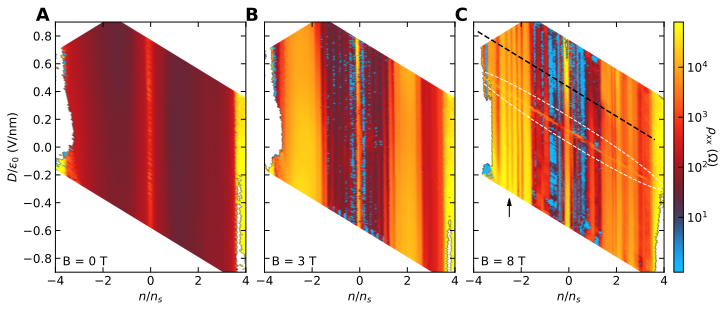

In [41]:
n0 = 4.627220521567039
fig = plt.figure(figsize=(10, 4), constrained_layout=True)
gss = fig.add_gridspec(1, 4, width_ratios=[1, 1, 1, 0.05])

xs = np.linspace(-8, 8, 201)
ys = np.linspace(-3, 3, 151)

xst = np.tile(xs, len(ys)).reshape(len(ys), len(xs))
yst = np.tile(ys, len(xs)).reshape(len(xs), len(ys)).T

currdat = -np.loadtxt(os.path.join(datapath, 's2a/sr830_3_X.dat.gz'))
curr = reshape_and_pad(currdat, len(ys), len(xs))
zdat = np.loadtxt(os.path.join(datapath, 's2a/sr830_1_X.dat.gz'))
zs = np.ma.masked_array(reshape_and_pad(zdat, len(ys), len(xs)), curr < 1e-10) / curr / SQUARES

ax0 = fig.add_subplot(gss[0])

n, D = xformgates(xst, yst)
n /= n0 / 4
ax0.pcolormesh(n, D, zs, cmap=coldhot, norm=SymLogNorm(linthresh=0.1, base=10, vmin=0.8, vmax=8e4), linewidth=0, rasterized=True)
ax0.set_xlim(-4, 4)
ax0.set_ylim(-0.9, 0.9)


xs = np.linspace(-8, 8, 401)
ys = np.linspace(-3, 3, 151)

xst = np.tile(xs, len(ys)).reshape(len(ys), len(xs))
yst = np.tile(ys, len(xs)).reshape(len(xs), len(ys)).T

currdat = -np.loadtxt(os.path.join(datapath, 's2b/sr830_3_X.dat.gz'))
curr = reshape_and_pad(currdat, len(ys), len(xs))
zdat = np.loadtxt(os.path.join(datapath, 's2b/sr830_1_X.dat.gz'))
zs = np.ma.masked_array(reshape_and_pad(zdat, len(ys), len(xs)), curr < 1e-10) / curr / SQUARES

ax1 = fig.add_subplot(gss[1])

n, D = xformgates(xst, yst)
n /= n0 / 4
ax1.pcolormesh(n, D, zs, cmap=coldhot, norm=SymLogNorm(linthresh=0.1, base=10, vmin=0.8, vmax=8e4), linewidth=0, rasterized=True)
ax1.set_xlim(-4, 4)
ax1.set_ylim(-0.9, 0.9)


xs = np.linspace(-8, 8, 801)
ys = np.linspace(-3, 3, 151)

xst = np.tile(xs, len(ys)).reshape(len(ys), len(xs))
yst = np.tile(ys, len(xs)).reshape(len(xs), len(ys)).T

currdat = -np.loadtxt(os.path.join(datapath, 's2c/sr830_3_X.dat.gz'))
curr = reshape_and_pad(currdat, len(ys), len(xs))
zdat = np.loadtxt(os.path.join(datapath, 's2c/sr830_1_X.dat.gz'))
zs = np.ma.masked_array(reshape_and_pad(zdat, len(ys), len(xs)), curr < 1e-10) / curr / SQUARES

ax2 = fig.add_subplot(gss[2])

n, D = xformgates(xst, yst)
n /= n0 / 4
c = ax2.pcolormesh(n, D, zs, cmap=coldhot, norm=SymLogNorm(linthresh=0.1, base=10, vmin=0.8, vmax=8e4), linewidth=0, rasterized=True)
ax2.set_xlim(-4, 4)
ax2.set_ylim(-0.9, 0.9)
ax2.add_patch(mpl.patches.Ellipse((0, 0.125), 8, 0.19, -6, ec='white', fc='none', lw=1, ls='--'))

ax0.set_xlabel('$n/n_s$')
ax1.set_xlabel('$n/n_s$')
ax2.set_xlabel('$n/n_s$')
plt.setp(ax1.get_yticklabels(), visible=False)
plt.setp(ax2.get_yticklabels(), visible=False)

ax0.text(-4 + 0.3, -1 + 0.15, 'B = 0 T')
ax1.text(-4 + 0.3, -1 + 0.15, 'B = 3 T')
ax2.text(-4 + 0.3, -1 + 0.15, 'B = 8 T')

ax0.set_ylabel('$D/\\epsilon_0$ (V/nm)')

xst = np.linspace(-8.84, 1.54, 1039)
yst = np.array([1.5] * 1039)
n, D = xformgates(xst, yst)
n /= n0 / 4
ax2.plot(n, D, 'k--')

ax2.arrow(-2.5, -0.5, 0, 0.13, head_width=0.15, head_length=0.05, length_includes_head=True, color='k')

t1 = fig.text(-0.03, 0.99, 'A', ha='right', va='bottom', transform=ax0.transAxes, fontweight='bold', fontsize=18)
t2 = fig.text(-0.03, 0.99, 'B', ha='right', va='bottom', transform=ax1.transAxes, fontweight='bold', fontsize=18)
t3 = fig.text(-0.03, 0.99, 'C', ha='right', va='bottom', transform=ax2.transAxes, fontweight='bold', fontsize=18)
plt.colorbar(c, cax=fig.add_subplot(gss[3]), ticks=[1e1, 1e2, 1e3, 1e4]).ax.set_ylabel('$ρ_{xx}$ (Ω)', rotation=270, va='center')
plt.savefig(os.path.join(figurepath, 'figS2.pdf'), bbox_extra_artists=(t1, t2, t3), bbox_inches='tight')

plt.show()

# Fig. S3

In [43]:
xs = np.linspace(-4, 4, 1039)
ys = np.linspace(14, 0, 701)
curr = -np.loadtxt(os.path.join(datapath, 'superfan/sr830_3_X.dat.gz'))[:,-1].reshape(len(ys), len(xs))
zs2 = np.ma.masked_array(np.loadtxt(os.path.join(datapath, 'superfan/sr830_2_X.dat.gz'))[:,-1].reshape(len(ys), len(xs)), curr < 1e-10) / curr / SQUARES
zs3 = np.ma.masked_array(np.loadtxt(os.path.join(datapath, 'superfan/sr830_4_X.dat.gz'))[:,-1].reshape(len(ys), len(xs)), curr < 1e-10) / curr / SQUARES

fig = plt.figure(figsize=(10, 6), constrained_layout=True)
fig.set_constrained_layout_pads(w_pad=4./72., h_pad=1./72., hspace=0., wspace=0.)
gss = fig.add_gridspec(2, 3, width_ratios=[1, 1, 0.03])
ax0 = fig.add_subplot(gss[0, 0]) # 4 - 5
ax1 = fig.add_subplot(gss[0, 1]) # 7 - 8

c = ax0.pcolormesh(xs, ys, zs2, cmap=coldhot, norm=SymLogNorm(linthresh=0.1, base=10, vmin=1, vmax=2e5), linewidth=0, rasterized=True)
c.set_edgecolor('face')
ax0.set_ylabel('$B$ (T)')
ax0.set_xlim(-4, 4)
ax1.set_xlim(-4, 4)
ax0.tick_params(axis='both', which='both', direction='in', bottom=True, top=True, left=True, right=True)
ax0.set_ylim(0, 13.99)
ax1.set_ylim(0, 13.99)

ax1.pcolormesh(xs, ys, zs3, cmap=coldhot, norm=SymLogNorm(linthresh=0.1, base=10, vmin=1, vmax=2e5), linewidth=0, rasterized=True)

plt.setp(ax1.get_yticklabels(), visible=False)
cax = fig.add_subplot(gss[:, 2])
plt.colorbar(c, cax=cax, ticks=[1e1, 1e2, 1e3, 1e4, 1e5]).ax.set_ylabel('$ρ_{xx}$ (Ω)', rotation=270, va='center')


xs2 = np.linspace(-8, 8, 801)
ys2 = np.linspace(-3, 3, 151)

xst2 = np.tile(xs2, len(ys2)).reshape(len(ys2), len(xs2))
yst2 = np.tile(ys2, len(xs2)).reshape(len(xs2), len(ys2)).T

curr2 = -np.loadtxt(os.path.join(datapath, 's3c/sr830_3_X.dat.gz')).reshape(len(ys2), len(xs2))
zdat2 = np.loadtxt(os.path.join(datapath, 's3c/sr830_2_X.dat.gz')).reshape(len(ys2), len(xs2))
zs2 = np.ma.masked_array(zdat2, curr2 < 1e-10) / curr2 / SQUARES

ax2 = fig.add_subplot(gss[1, 0])

n, D = xformgates(xst2, yst2)
n /= 4.395859495488687 / 4
ax2.pcolormesh(n, D, zs2, cmap=coldhot, norm=SymLogNorm(linthresh=0.1, base=10, vmin=1, vmax=2e5), linewidth=0, rasterized=True)
ax2.set_xlim(-4, 4)
ax2.set_ylim(-0.9, 0.9)

ax2.set_ylabel('$D/\\epsilon_0$ (V/nm)')

xs3 = np.linspace(-8, 8, 801)
ys3 = np.linspace(-3, 3, 151)

xst3 = np.tile(xs3, len(ys3)).reshape(len(ys3), len(xs3))
yst3 = np.tile(ys3, len(xs3)).reshape(len(xs3), len(ys3)).T

zdat3 = np.loadtxt(os.path.join(datapath, 's3c/sr830_4_X.dat.gz')).reshape(len(ys2), len(xs2))
zs3 = np.ma.masked_array(zdat3, curr2 < 1e-10) / curr2 / SQUARES

ax3 = fig.add_subplot(gss[1, 1])

n, D = xformgates(xst3, yst3)
n /= 4.583360611410005 / 4
ax3.pcolormesh(n, D, zs3, cmap=coldhot, norm=SymLogNorm(linthresh=0.1, base=10, vmin=1, vmax=2e5), linewidth=0, rasterized=True)
ax3.set_xlim(-4, 4)
ax3.set_ylim(-0.9, 0.9)
plt.setp(ax0.get_xticklabels(), visible=False)
plt.setp(ax1.get_xticklabels(), visible=False)
plt.setp(ax3.get_yticklabels(), visible=False)
ax2.set_xlabel('$n/n_s$')
ax3.set_xlabel('$n/n_s$')

t1 = fig.text(-0.04, 0.96, 'A', ha='right', va='bottom', transform=ax0.transAxes, fontweight='bold', fontsize=18)
t2 = fig.text(-0.01, 0.96, 'B', ha='right', va='bottom', transform=ax1.transAxes, fontweight='bold', fontsize=18)
t3 = fig.text(-0.04, 0.96, 'C', ha='right', va='bottom', transform=ax2.transAxes, fontweight='bold', fontsize=18)
t4 = fig.text(-0.01, 0.96, 'D', ha='right', va='bottom', transform=ax3.transAxes, fontweight='bold', fontsize=18)
plt.savefig(os.path.join(figurepath, 'figS3.pdf'), bbox_extra_artists=(t1, t2, t3, t4), bbox_inches='tight')

plt.show()

# Fig. S4

In [8]:
xs = np.linspace(-4, 4, 1039)
ys = np.linspace(14, 0, 701)
curr = -np.loadtxt(os.path.join(datapath, 'superfan/sr830_3_X.dat.gz'))[:,-1].reshape(len(ys), len(xs))
zs = np.ma.masked_array(np.loadtxt(os.path.join(datapath, 'superfan/sr830_4_X.dat.gz'))[:,-1].reshape(len(ys), len(xs)), curr < 1e-10) / curr / SQUARES

In [9]:
q = 4001
a1_6, a2_6 = 0.3, 2.0j
ps = np.arange(0, np.ceil(q * 0.05))
if False:
    eigs6 = cpget(cp.sort(calc_spectrum(ps, q, a1_6, a2_6)))
    np.savetxt(os.path.join(datapath, 'spectra/eigs6.txt.gz'), eigs6)
else:
    eigs6 = np.loadtxt(os.path.join(datapath, 'spectra/eigs6.txt.gz'))
g6 = np.gradient(eigs6)[1]
a6 = ps / q
n6 = np.linspace(0, 1, q)

In [10]:
q = 1999
a1_7, a2_7 = 2, -0.6
ps = np.arange(0, np.ceil(q * 0.25))
if False:
    eigs7 = cpget(cp.sort(calc_spectrum(ps, q, a1_7, a2_7)))
    np.savetxt(os.path.join(datapath, 'spectra/eigs7.txt.gz'), eigs7)
else:
    eigs7 = np.loadtxt(os.path.join(datapath, 'spectra/eigs7.txt.gz'))
g7 = np.gradient(eigs7)[1]
a7 = ps / q
n7 = np.linspace(0, 1, q)

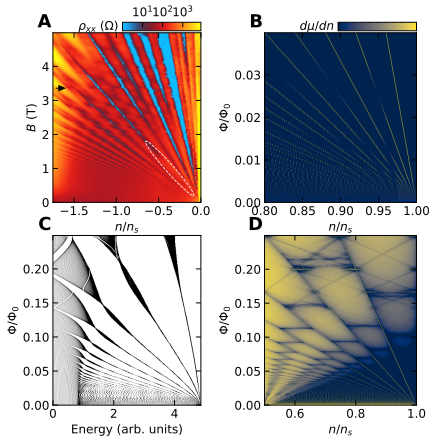

In [11]:
fig = plt.figure(figsize=(6, 6), constrained_layout=True)
fig.set_constrained_layout_pads(w_pad=4./72., h_pad=1./72., hspace=0., wspace=0.)
gss = fig.add_gridspec(3, 4, height_ratios=[0.05, 1, 1], width_ratios=[0.1, 0.9, 0.1, 0.9])
ax0 = fig.add_subplot(gss[1, 0:2])
c = ax0.pcolormesh(xs, ys, zs, cmap=coldhot, norm=SymLogNorm(linthresh=0.1, base=10, vmin=1, vmax=8e3), linewidth=0, rasterized=True)

c.set_edgecolor('face')
ax0.set_ylabel('$B$ (T)')
ax0.set_xlim(-1.75, 0)
ax0.set_ylim(0, 4.99)
ax0.set_xlabel('$n/n_s$')
ax0.add_patch(mpl.patches.Ellipse((-0.37, 1), 0.12, 1.7, 19.3, ec='white', fc='none', lw=0.8, ls='--'))
ax0.arrow(-1.71, 3.36, 0.03, 0, head_width=0.15, head_length=0.07, color='black')

cax = fig.add_subplot(gss[0, 1])
plt.colorbar(c, cax=cax, ticks=[1e1, 1e2, 1e3], orientation='horizontal').ax.set_ylabel('$ρ_{xx}$ (Ω)', rotation=0, ha='right', va='center')
cax.xaxis.set_ticks_position('top')

ax3 = fig.add_subplot(gss[1, 2:4])
c = ax3.pcolormesh(n6, a6, g6, vmax=0.1, linewidth=0, rasterized=True)
ax3.set_xlim(0.8, 1.0)
ax3.set_ylim(0, 0.0399)
ax3.set_ylabel('$\\Phi/\\Phi_0$')
ax3.set_xlabel('$n/n_s$')

cax = fig.add_subplot(gss[0, 3])
plt.colorbar(c, cax=cax, ticks=[], orientation='horizontal').ax.set_ylabel('$d\\mu /dn$', rotation=0, ha='right', va='center')
cax.xaxis.set_ticks_position('top')


ax4 = fig.add_subplot(gss[2, 0:2])
H, xedges, yedges = np.histogram2d(eigs7.flatten(), np.repeat(a7, q), bins=makebins(eigs7, a7))
plt.imshow(H.T, cmap='Greys', vmax=8, extent=[xedges[0], xedges[-1], yedges[-1], yedges[0]], interpolation='antialiased', aspect='auto')
ax4.set_ylim(0, 0.249)
ax4.set_xlim(0, np.max(eigs7))
ax4.set_ylabel('$\\Phi/\\Phi_0$')
ax4.set_xlabel('Energy (arb. units)')

ax5 = fig.add_subplot(gss[2, 2:4])
ax5.pcolormesh(n7, a7, g7, norm=SymLogNorm(linthresh=0.000001, base=10, vmin=0.000001, vmax=0.01), linewidth=0, rasterized=True)
ax5.set_xlim(0.5, 1)
ax5.set_xlabel('$n/n_s$')
ax5.set_ylabel('$\\Phi/\\Phi_0$')

t1 = fig.text(-0.01, 1.01, 'A', ha='right', va='bottom', transform=ax0.transAxes, fontweight='bold', fontsize=18)
t2 = fig.text(-0.01, 1.01, 'B', ha='right', va='bottom', transform=ax3.transAxes, fontweight='bold', fontsize=18)
t3 = fig.text(-0.01, 1.01, 'C', ha='right', va='bottom', transform=ax4.transAxes, fontweight='bold', fontsize=18)
t4 = fig.text(-0.01, 1.01, 'D', ha='right', va='bottom', transform=ax5.transAxes, fontweight='bold', fontsize=18)
plt.savefig(os.path.join(figurepath, 'figS4.pdf'), bbox_extra_artists=(t1, t2, t3, t4), bbox_inches='tight')

plt.show()

# Fig. S5

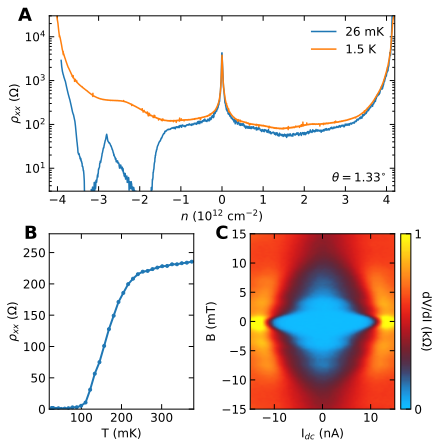

In [47]:
fig1 = plt.figure(figsize=(6, 6), constrained_layout=True)
gs = fig1.add_gridspec(2, 3, width_ratios=[1, 1, 0.07], height_ratios=[1, 1])

f1_ax3 = fig1.add_subplot(gs[0, :2])

curr = -np.loadtxt(os.path.join(datapath, 's5a/sr830_3_X.dat.gz'))
x = np.loadtxt(os.path.join(datapath, 's5a/yoko_1_volt.dat.gz'))
y = np.loadtxt(os.path.join(datapath, 's5a/sr830_1_X.dat.gz'))

x = (x + 1.4 + 0.13) / 1.12
y = np.ma.masked_array(np.abs(y) / curr / SQUARES, curr < 1e-10)
f1_ax3.semilogy(x, y, label='26 mK')

curr = np.loadtxt(os.path.join(datapath, 's5a/fbl_c31_x.dat.gz'))
x = np.loadtxt(os.path.join(datapath, 's5a/k_0_volt.dat.gz'))
y = np.loadtxt(os.path.join(datapath, 's5a/fbl_c2_x.dat.gz'))

x = (x + 1.53) / 1.12
y = np.ma.masked_array(y / curr / SQUARES, curr < 5e-9)
f1_ax3.semilogy(x, y, label='1.5 K')

f1_ax3.set_xlim(-4.2, 4.2)
f1_ax3.set_ylim(3, 3e4)
f1_ax3.legend(loc=1, frameon=False)
f1_ax3.set_ylabel('$ρ_{xx}$ (Ω)')
f1_ax3.set_xlabel('$n$ ($10^{12}$ cm$^{-2}$)')

f1_ax2 = fig1.add_subplot(gs[1, 0])
curr = np.loadtxt(os.path.join(datapath, 's5b/sr830_3_X.dat.gz'))
x = np.loadtxt(os.path.join(datapath, 's5b/k_1_volt.dat.gz'))
y = np.loadtxt(os.path.join(datapath, 's5b/sr830_1_X.dat.gz'))

y = y / SQUARES / curr
ts = np.loadtxt(os.path.join(datapath, 's5b/T.dat.gz'))
f1_ax2.plot(ts*1000, y, '.-', linewidth=2)

f1_ax2.set_ylim(0, 280)
f1_ax2.set_xlim(20, 380)
f1_ax2.set_ylabel('$ρ_{xx}$ (Ω)')
f1_ax2.set_xlabel('T (mK)')

f1_ax1 = fig1.add_subplot(gs[1, 1])
xs = np.linspace(-15, 15, 61)
ys = np.linspace(-15, 15, 121)

curr = reshape_and_pad(-np.loadtxt(os.path.join(datapath, 's5c/sr830_3_X.dat.gz')), len(ys), len(xs))
zs = reshape_and_pad(np.loadtxt(os.path.join(datapath, 's5c/sr830_1_X.dat.gz')), len(ys), len(xs)) / curr
todel = list(range(31, 34)) # remove flux jump at ~-7 mT
zs = np.delete(zs, todel, axis=0)
ys = np.delete(ys, todel)

c = f1_ax1.pcolormesh(xs, ys, zs / 1000, cmap=coldhot, vmin=0, vmax=1, linewidth=0, rasterized=True)
f1_ax1.set_xlabel('I$_{dc}$ (nA)')
f1_ax1.set_ylabel('B (mT)')

cax = fig1.add_subplot(gs[1, 2])
plt.colorbar(c, cax=cax, ticks=[0, 1]).ax.set_ylabel('dV/dI (kΩ)', rotation=270, va='center')

f1_ax3.text(4, 5, '$\\theta = 1.33^{\circ}$', ha='right')

t1 = fig1.text(-0.05, 0.95, 'A', ha='right', va='bottom', transform=f1_ax3.transAxes, fontweight='bold', fontsize=18)
t2 = fig1.text(-0.08, 0.95, 'B', ha='right', va='bottom', transform=f1_ax2.transAxes, fontweight='bold', fontsize=18)
t3 = fig1.text(-0.15, 0.95, 'C', ha='right', va='bottom', transform=f1_ax1.transAxes, fontweight='bold', fontsize=18)
plt.savefig(os.path.join(figurepath, 'figS5.pdf'), bbox_extra_artists=(t1, t2, t3), bbox_inches='tight')

plt.show()

# Fig. S6

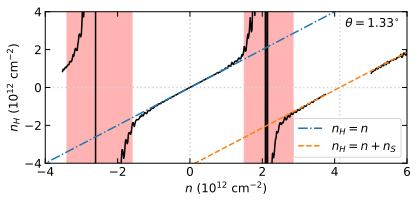

λ: 10.6 nm
θ: 1.334°


In [216]:
xs = np.linspace(-8, 8, 801)
ys = np.linspace(-0.5, 0.5, 21)
curr = -np.loadtxt(os.path.join(datapath, 'hall/sr860_0_X.txt.gz')).reshape(21, 801)

# sr830_7_X - contact pair 13-3
# sr830_3_X - contact pair 14-4
zs = np.ma.masked_array(np.loadtxt(os.path.join(datapath, 'hall/sr830_7_X.txt.gz')) / curr, curr < 8e-10)
zs = (np.flip(zs, axis=0) - zs) / 2
zs = np.gradient(zs, ys, xs)[0]
zs = zs[3:-3,:]
ys = ys[3:-3]

ns = 1 / np.mean(zs, axis=0) / e / 1e4 / 1e12
errs = ns * np.std(zs, axis=0) / np.mean(zs, axis=0)

f0mask = (xs > -4) & (xs < -2) & (ns < 10) & (ns > -10) & (errs < 3)
f0xs = xs[f0mask]
f0ys = ns[f0mask]
f0errs = errs[f0mask]

(f0m, f0b), cov = np.polyfit(f0xs, f0ys, 1, w=1/f0errs, cov=True)

f1xs = xs * f0m + f0b

f2mask = (f1xs > 3) & (f1xs < 6)
f2xs = f1xs[f2mask]
f2ys = ns[f2mask]
f2errs = errs[f2mask]

(f2m, f2b), cov = np.polyfit(f2xs, f2ys, 1, w=1/f2errs, cov=True)
offset = -f2b / f2m

plt.figure(figsize=(6, 3))
plt.axvspan(-3.4, -1.6, color='red', alpha=0.3, zorder=-100)
plt.axvspan(1.5, 2.85, color='red', alpha=0.3, zorder=-100)
plt.axhline(0, ls=':', color='lightgrey', zorder=-50)
plt.axvline(0, ls=':', color='lightgrey', zorder=-50)
plt.axvline(offset, ls=':', color='lightgrey', zorder=-50)

#plt.fill_between(f1xs, ns + errs, ns - errs, color='grey', alpha=1.0)
plt.plot(f1xs, ns, color='k')
plt.plot([-5, 5], [-5, 5], '-.', label='$n_H = n$')
plt.plot([-5 + offset, 5 + offset], [-5, 5], '--', label='$n_H = n + n_S$')

plt.xlim(-4, 6)
plt.ylim(-4, 4)
plt.xlabel('$n$ (10$^{12}$ cm$^{-2}$)')
plt.ylabel('$n_H$ (10$^{12}$ cm$^{-2}$)')
plt.text(5.8, 3.2, '$\\theta = 1.33^{\circ}$', ha='right')
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(figurepath, 'figS6.pdf'), bbox_inches='tight')
plt.show()

nsat = offset # 10^12 cm^-2
lambdasat = np.sqrt(8/(np.sqrt(3)*nsat*1E16))*10**9
print(f'λ: {lambdasat:.1f} nm')
epsilon = 0
a = 0.246
theta = np.arccos(((2 + 2*epsilon + epsilon**2)*lambdasat**2 - (1 + epsilon)**2*a**2)/(2*(1 + epsilon)*lambdasat**2))*180/np.pi
print(f'θ: {theta:.3f}°')

# Fig. S7

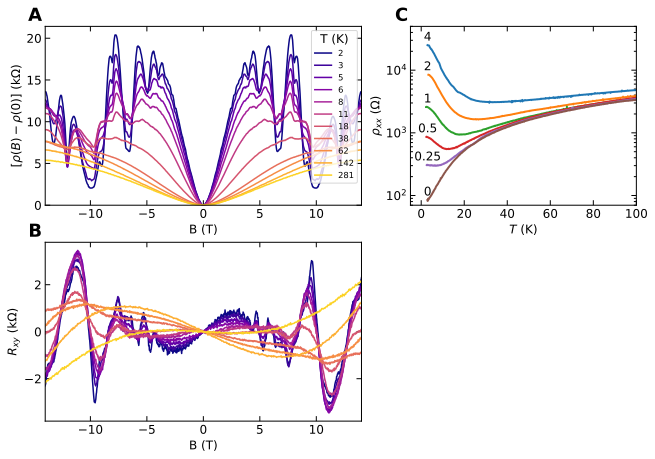

In [48]:
fig = plt.figure(figsize=(9, 6), constrained_layout=True)
gs = fig.add_gridspec(2, 2, width_ratios=[1.4, 1])

runs = [76, 85, 80, 89, 87, 83, 91, 93, 95, 103, 114]

ax0 = fig.add_subplot(gs[1, 0])
for i, run in enumerate(runs):
    curr = np.loadtxt(os.path.join(datapath, f's6a/{run}_fbl_c31_x.dat.gz'))
    temperature = np.median(np.loadtxt(os.path.join(datapath, f's6a/{run}_cc_A_temperature.dat.gz')))
    x = np.loadtxt(os.path.join(datapath, f's6a/{run}_b.dat.gz'))
    y = np.loadtxt(os.path.join(datapath, f's6a/{run}_fbl_c22_x.dat.gz'))
    y /= curr * 1000
    y = (y - np.flip(y)) / 2
    ax0.plot(x, y, label=f'{temperature:.0f}', color=plt.cm.plasma(i / len(runs)))
ax0.set_ylabel('$R_{xy}$ (kΩ)')
ax0.set_xlabel('B (T)')
ax0.set_xlim(-14, 14)

ax1 = fig.add_subplot(gs[0, 0])
for i, run in enumerate(runs):
    curr = np.loadtxt(os.path.join(datapath, f's6b/{run}_fbl_c31_x.dat.gz'))
    temperature = np.median(np.loadtxt(os.path.join(datapath, f's6b/{run}_cc_A_temperature.dat.gz')))
    x = np.loadtxt(os.path.join(datapath, f's6b/{run}_b.dat.gz'))
    y = np.loadtxt(os.path.join(datapath, f's6b/{run}_fbl_c22_x.dat.gz'))
    y /= SQUARES * curr * 1000
    y = (y + np.flip(y)) / 2
    y = (y - y[len(y) // 2])
    ax1.plot(x, y, label=f'{temperature:.0f}', color=plt.cm.plasma(i / len(runs)))
ax1.set_ylabel('$\\left [ \\rho(B) - \\rho(0)\\right ]$ (kΩ)')
ax1.set_xlabel('B (T)')
ax1.set_xlim(-14, 14)
ax1.set_ylim(0)
ax1.legend(loc=1, title='T (K)', fontsize='x-small')

ax2 = fig.add_subplot(gs[0, 1])
runs = [(9, '0'), (19, '0.25'), (22, '0.5'), (25, '1'), (31, '2'), (42, '4')]
for i, (run, field) in enumerate(reversed(runs)):
    curr = np.loadtxt(os.path.join(datapath, f's6c/{run}_fbl_c31_x.dat.gz'))
    y = np.loadtxt(os.path.join(datapath, f's6c/{run}_fbl_c5_x.dat.gz'))
    x1 = np.loadtxt(os.path.join(datapath, f's6c/{run}_cc_A_temperature.dat.gz'))
    x2 = np.loadtxt(os.path.join(datapath, f's6c/{run}_cc_B_temperature.dat.gz'))

    minlen = min(len(y), len(x1), len(x2), len(curr))

    xstdep, ystdep = zip(*sorted(zip((x1[:minlen] + x2[:minlen]) / 2, y[:minlen] / curr[:minlen] / SQUARES)))

    ax2.semilogy(xstdep, ystdep, label=f'{field} T', lw=2)
    plt.text(3, ystdep[0]*1.08, f'{field}', ha='center', va='bottom')
ax2.set_xlim(-5, 100)
ax2.set_ylim(70, 50000)
ax2.set_ylabel('$ρ_{xx}$ (Ω)')
ax2.set_xlabel('$T$ (K)')
n = (-4.5 + 1.55) / 1.12 * 4.3/4

t1 = fig.text(-0.01, 1.01, 'A', ha='right', va='bottom', transform=ax1.transAxes, fontweight='bold', fontsize=18)
t2 = fig.text(-0.01, 1.01, 'B', ha='right', va='bottom', transform=ax0.transAxes, fontweight='bold', fontsize=18)
t3 = fig.text(-0.01, 1.01, 'C', ha='right', va='bottom', transform=ax2.transAxes, fontweight='bold', fontsize=18)
plt.savefig(os.path.join(figurepath, 'figS7.pdf'), bbox_extra_artists=(t1, t2, t3), bbox_inches='tight')

plt.show()

# Fig. S8

In [6]:
xs = np.linspace(-4, 4, 1039)
ys = np.linspace(14, 0, 701)
curr = -np.loadtxt(os.path.join(datapath, 'superfan/sr830_3_X.dat.gz'))[:,-1].reshape(len(ys), len(xs))
zs = np.ma.masked_array(np.loadtxt(os.path.join(datapath, 'superfan/sr830_4_X.dat.gz'))[:,-1].reshape(len(ys), len(xs)), curr < 1e-10) / curr / SQUARES

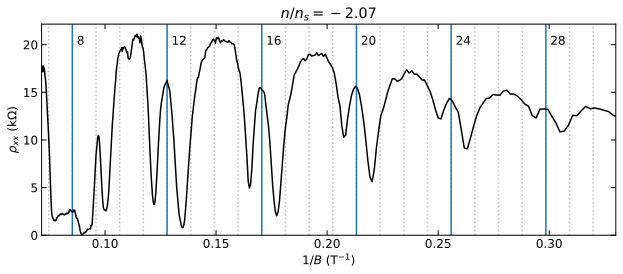

In [8]:
eye = 250
plt.figure(figsize=(9, 4))
plt.xlim(1/14, 0.33)
for nu in range(7, 31):
    plt.axvline(nu / 23.45 / 4, ls=':', color='grey', alpha=0.5)
for nu in range(2, 8):
    plt.axvline(nu / 23.45, alpha=1)
    plt.text(nu / 23.45 + 0.002, 20, f'{nu * 4}')
plt.plot(1/ys, zs[:,eye] / 1000, 'k')
plt.ylabel('$\\rho_{xx}$ (k$\\Omega$)')
plt.xlabel('$1/B$ (T$^{-1}$)')
plt.title(f'$n/n_s = {xs[eye]:.2f}$')
plt.ylim(0)
plt.tight_layout()
plt.savefig(os.path.join(figurepath, 'figS8.pdf'))
plt.show()

# Fig. S9

In [5]:
q = 3001
ps = np.arange(np.floor(q * 0.19) - 1, np.ceil(q * 0.21) + 1)

alphas = ps / q
ns = np.linspace(0, 1, q)
eigs = []
gs = []

for i, a1 in enumerate(np.linspace(0, 1, 5)):
    te = []
    tg = []
    for j, a2 in enumerate(np.linspace(1, 4, 7)):
        if False:
            e = cpget(cp.sort(calc_spectrum(ps, q, a1, a2 * 1j)))
            np.savetxt(os.path.join(datapath, f'spectra/eigs_{i}_{j}.txt.gz'), e)
        else:
            e = np.loadtxt(os.path.join(datapath, f'spectra/eigs_{i}_{j}.txt.gz'))
        g = np.gradient(e)[1]
        te.append(e)
        tg.append(g)
        print(i, j)
    eigs.append(te)
    gs.append(tg)

0 0
0 1
0 2
0 3
0 4
0 5
0 6
1 0
1 1
1 2
1 3
1 4
1 5
1 6
2 0
2 1
2 2
2 3
2 4
2 5
2 6
3 0
3 1
3 2
3 3
3 4
3 5
3 6
4 0
4 1
4 2
4 3
4 4
4 5
4 6


In [6]:
f, axs = plt.subplots(5, 7, sharex=True, sharey=True, figsize=(10, 8))
for i, a1_6 in enumerate(np.linspace(0, 1, 5)):
    for j, a2_6 in enumerate(np.linspace(1, 4, 7)):
        ax = axs[i, j]
        ax.pcolormesh(ns, alphas, gs[i][j], vmax=0.018, linewidth=0, rasterized=True)
        ax.set_xlim(0.15, 0.25)
        ax.set_ylim(0.19, 0.21)
        plt.setp(ax.get_yticklabels(), visible=False)
        plt.setp(ax.get_xticklabels(), visible=False)
for i, a1_6 in enumerate(np.linspace(0, 1, 5)):
    axs[i, 0].set_ylabel(f'${a1_6:.2f}$')
for j, a2_6 in enumerate(np.linspace(1, 4, 7)):
    axs[0, j].set_xlabel(f'${a2_6:.1f}i$')
    axs[0, j].xaxis.set_label_position('top')
f.supylabel('$a_1$')
f.suptitle('$a_2$')
plt.tight_layout()
f.subplots_adjust(wspace=0.04, hspace=0.04)
plt.savefig(os.path.join(figurepath, 'figS9.pdf'))
plt.show()

# Fig. S10

In [140]:
q = 4001
ps = np.arange(np.floor(q * 0.19) - 1, np.ceil(q * 0.21) + 1)
ns = np.linspace(0, 1, q)
a = ps / q

a1_2, a2_2 = 0.0, 1.0j
a1_3, a2_3 = 0.0, 2.5j
a1_4, a2_4 = 0.2, 2.5j
a1_5, a2_5 = 0.4, 2.5j

if False:
    eigs2 = cpget(cp.sort(calc_spectrum(ps, q, a1_2, a2_2)))
    np.savetxt(os.path.join(datapath, 'spectra/eigs_s9_0.txt.gz'), eigs2)
else:
    eigs2 = np.loadtxt(os.path.join(datapath, 'spectra/eigs_s9_0.txt.gz'))

if False:
    eigs3 = cpget(cp.sort(calc_spectrum(ps, q, a1_3, a2_3)))
    np.savetxt(os.path.join(datapath, 'spectra/eigs_s9_1.txt.gz'), eigs3)
else:
    eigs3 = np.loadtxt(os.path.join(datapath, 'spectra/eigs_s9_1.txt.gz'))

if False:
    eigs4 = cpget(cp.sort(calc_spectrum(ps, q, a1_4, a2_4)))
    np.savetxt(os.path.join(datapath, 'spectra/eigs_s9_2.txt.gz'), eigs4)
else:
    eigs4 = np.loadtxt(os.path.join(datapath, 'spectra/eigs_s9_2.txt.gz'))

if False:
    eigs5 = cpget(cp.sort(calc_spectrum(ps, q, a1_5, a2_5)))
    np.savetxt(os.path.join(datapath, 'spectra/eigs_s9_3.txt.gz'), eigs5)
else:
    eigs5 = np.loadtxt(os.path.join(datapath, 'spectra/eigs_s9_3.txt.gz'))

g2 = np.gradient(eigs2)[1]
g3 = np.gradient(eigs3)[1]
g4 = np.gradient(eigs4)[1]
g5 = np.gradient(eigs5)[1]

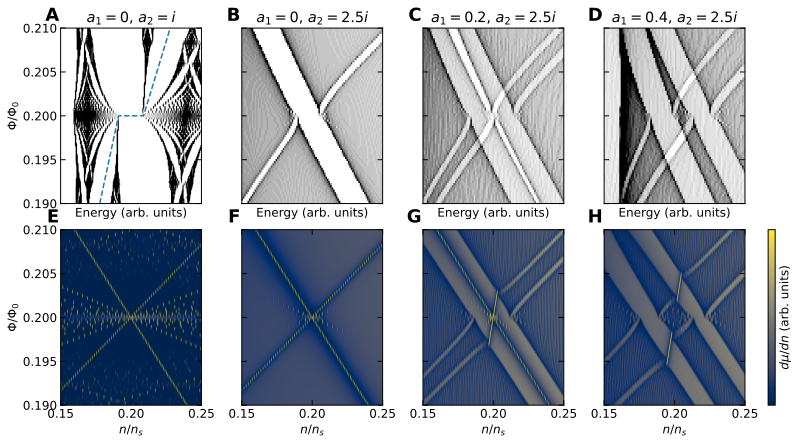

In [144]:
fig = plt.figure(figsize=(11, 6), constrained_layout=True)
gss = fig.add_gridspec(2, 5, width_ratios=[1, 1, 1, 1, 0.05])

ax0 = fig.add_subplot(gss[0, 0])
ax0.set_title('$a_1 = 0$, $a_2 = i$')
H, xedges, yedges = np.histogram2d(eigs2.flatten(), np.repeat(a, q), bins=makebins(eigs2, a))
plt.imshow(H.T, cmap='Greys', vmax=15, extent=[xedges[0], xedges[-1], yedges[-1], yedges[0]], interpolation='antialiased', aspect='auto')
ax0.tick_params(bottom=False, top=False)
plt.setp(ax0.get_xticklabels(), visible=False)
ax0.set_ylim(0.19, 0.21)
ax0.set_xlim(-2.7, -1.8)
ax0.set_ylabel('$\\Phi/\\Phi_0$')
ax0.set_xlabel('Energy (arb. units)')
ax0.plot([-2.45, -2.33, -2.17, -2.0], [0.19, 0.2, 0.2, 0.21], '--')


ax1 = fig.add_subplot(gss[1, 0])
c1 = ax1.pcolormesh(ns, a, g2, vmax=0.005, linewidth=0, rasterized=True)
ax1.set_ylim(0.19, 0.21)
ax1.set_xlim(0.15, 0.25)
ax1.set_ylabel('$\\Phi/\\Phi_0$')
ax1.set_xlabel('$n/n_s$')

ax2 = fig.add_subplot(gss[0, 1])
ax2.set_title('$a_1 = 0$, $a_2 = 2.5i$')
H, xedges, yedges = np.histogram2d(eigs3.flatten(), np.repeat(a, q), bins=makebins(eigs3, a))
plt.imshow(H.T, cmap='Greys', vmax=15, extent=[xedges[0], xedges[-1], yedges[-1], yedges[0]], interpolation='antialiased', aspect='auto')
ax2.tick_params(bottom=False, top=False)
plt.setp(ax2.get_xticklabels(), visible=False)
plt.setp(ax2.get_yticklabels(), visible=False)
ax2.set_ylim(0.19, 0.21)
ax2.set_xlim(-4.8, -3.8)
ax2.set_xlabel('Energy (arb. units)')


ax3 = fig.add_subplot(gss[1, 1])
c3 = ax3.pcolormesh(ns, a, g3, vmax=0.008, linewidth=0, rasterized=True)
ax3.set_ylim(0.19, 0.21)
ax3.set_xlim(0.15, 0.25)
plt.setp(ax3.get_yticklabels(), visible=False)
ax3.set_xlabel('$n/n_s$')

ax4 = fig.add_subplot(gss[0, 2])
ax4.set_title('$a_1 = 0.2$, $a_2 = 2.5i$')
H, xedges, yedges = np.histogram2d(eigs4.flatten(), np.repeat(a, q), bins=makebins(eigs4, a))
plt.imshow(H.T, cmap='Greys', vmax=15, extent=[xedges[0], xedges[-1], yedges[-1], yedges[0]], interpolation='antialiased', aspect='auto')
ax4.tick_params(bottom=False, top=False)
plt.setp(ax4.get_xticklabels(), visible=False)
plt.setp(ax4.get_yticklabels(), visible=False)
ax4.set_ylim(0.19, 0.21)
ax4.set_xlim(-4.8, -3.8)
ax4.set_xlabel('Energy (arb. units)')


ax5 = fig.add_subplot(gss[1, 2])
c5 = ax5.pcolormesh(ns, a, g4, vmax=0.008, linewidth=0, rasterized=True)
ax5.set_ylim(0.19, 0.21)
ax5.set_xlim(0.15, 0.25)
plt.setp(ax5.get_yticklabels(), visible=False)
ax5.set_xlabel('$n/n_s$')


ax6 = fig.add_subplot(gss[0, 3])
ax6.set_title('$a_1 = 0.4$, $a_2 = 2.5i$')
H, xedges, yedges = np.histogram2d(eigs5.flatten(), np.repeat(a, q), bins=makebins(eigs5, a))
plt.imshow(H.T, cmap='Greys', vmax=15, extent=[xedges[0], xedges[-1], yedges[-1], yedges[0]], interpolation='antialiased', aspect='auto')
ax6.tick_params(bottom=False, top=False)
plt.setp(ax6.get_xticklabels(), visible=False)
plt.setp(ax6.get_yticklabels(), visible=False)
ax6.set_ylim(0.19, 0.21)
ax6.set_xlim(-4.8, -3.8)
ax6.set_xlabel('Energy (arb. units)')

ax7 = fig.add_subplot(gss[1, 3])
c7 = ax7.pcolormesh(ns, a, g5, vmax=0.008, linewidth=0, rasterized=True)
ax7.set_ylim(0.19, 0.21)
ax7.set_xlim(0.15, 0.25)
plt.setp(ax7.get_yticklabels(), visible=False)
ax7.set_xlabel('$n/n_s$')

cax = fig.add_subplot(gss[1, -1])
plt.colorbar(c7, cax=cax, orientation='vertical', ticks=[]).ax.set_ylabel('$d\\mu /dn$ (arb. units)')

t1 = fig.text(-0.01, 1.02, 'A', ha='right', va='bottom', transform=ax0.transAxes, fontweight='bold', fontsize=18)
t2 = fig.text(-0.01, 1.02, 'E', ha='right', va='bottom', transform=ax1.transAxes, fontweight='bold', fontsize=18)
t3 = fig.text(-0.01, 1.02, 'B', ha='right', va='bottom', transform=ax2.transAxes, fontweight='bold', fontsize=18)
t4 = fig.text(-0.01, 1.02, 'F', ha='right', va='bottom', transform=ax3.transAxes, fontweight='bold', fontsize=18)
t5 = fig.text(-0.01, 1.02, 'D', ha='right', va='bottom', transform=ax6.transAxes, fontweight='bold', fontsize=18)
t6 = fig.text(-0.01, 1.02, 'H', ha='right', va='bottom', transform=ax7.transAxes, fontweight='bold', fontsize=18)
t7 = fig.text(-0.01, 1.02, 'C', ha='right', va='bottom', transform=ax4.transAxes, fontweight='bold', fontsize=18)
t8 = fig.text(-0.01, 1.02, 'G', ha='right', va='bottom', transform=ax5.transAxes, fontweight='bold', fontsize=18)
plt.savefig(os.path.join(figurepath, 'figS10.pdf'), bbox_extra_artists=(t1, t2, t3, t4, t5, t6, t7, t8), bbox_inches='tight')

plt.show()